![](https://ucb.catolica.edu.br/hubfs/SITE/logo__catolica--footer.svg)

## Novas Tecnologias

Professor: Remis Balaniuk, 2024


# Análise exploratória e profiling de dados

In [2]:
!pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 12.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 38.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=9be2ca9e9a832eb07b31a2ebaf2f10d7151fc9cbac99386dcc5070620c7a69e3
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [3]:
import pandas as pd
import ydata_profiling
import seaborn as sns
sns.set(color_codes=True)
sns.set_palette(sns.color_palette("muted"))

A análise exploratória de dados (EDA) é uma abordagem estatística que visa descobrir e resumir um conjunto de dados. Nesta etapa do processo de ciência de dados, você deseja explorar a estrutura do seu conjunto de dados, as variáveis ​​e seus relacionamentos.

Nesse caderno focaremos em um aspecto da análise exploratória de dados: criação de perfil de dados. A criação de perfil de dados consiste em resumir seu conjunto de dados por meio de estatísticas descritivas. Você deseja usar uma infinidade de medidas para entender melhor seu conjunto de dados. Tipos de dados, valores ausentes, média, mediana e desvio padrão são apenas alguns dos muitos elementos que você precisará reunir ao criar um perfil de um conjunto de dados. O objetivo do perfil de dados é ter um entendimento sólido dos dados, para que você possa começar a consultar e visualizar os dados de várias maneiras.

Iniciaremos esse estudo explorando dados da base AdventureWorks relativos às vendas.

## Saiba de onde vêm seus dados

Antes de entrar em qualquer EDA, você deve saber o máximo possível sobre a procedência dos dados que está analisando. Você precisa entender como os dados foram coletados e como foram processados. Existem transformações passadas nos dados que podem afetar sua análise? Você deve responder a essas perguntas no seu conjunto de dados:

- Como foi coletado?
- É uma amostra?
- Foi amostrada adequadamente?
- O conjunto de dados foi transformado de alguma maneira?
- Existem alguns problemas conhecidos no conjunto de dados?

Se você não entender de onde vêm os dados, será difícil tirar conclusões significativas do conjunto de dados. Você também corre o risco de cometer erros de análise muito importantes.

Além disso, você deve garantir que o conjunto de dados esteja estruturado de maneira padronizada. O formato recomendado é a terceira forma normal, também chamada de dados organizados. Um conjunto de dados "organizado" possui os seguintes atributos:

- Cada variável forma uma coluna e contém valores
- Cada observação forma uma linha
- Cada tipo de unidade observacional forma uma tabela

O respeito a esse formato padronizado acelerará sua análise, pois é compatível com muitas ferramentas e bibliotecas.

In [13]:
data = pd.read_csv('covidporestadoedata.csv')
data.head()

,date,country,state,city,newDeaths,deaths,newCases,totalCases,deathsMS,totalCasesMS,deaths_per_100k_inhabitants,totalCases_per_100k_inhabitants,deaths_by_totalCases,recovered,suspects,tests,tests_per_100k_inhabitants
0,2020-02-25,Brazil,SP,TOTAL,0,0,1,1,0,0,0.0,0.00218,0.0,NaN,NaN,NaN,NaN
1,2020-02-25,Brazil,TOTAL,TOTAL,0,0,1,1,0,0,0.0,0.00048,0.0,NaN,NaN,NaN,NaN
2,2020-02-26,Brazil,SP,TOTAL,0,0,0,1,0,1,0.0,0.00218,0.0,NaN,NaN,NaN,NaN
3,2020-02-26,Brazil,TOTAL,TOTAL,0,0,0,1,0,1,0.0,0.00048,0.0,NaN,NaN,NaN,NaN
4,2020-02-27,Brazil,SP,TOTAL,0,0,0,1,0,1,0.0,0.00218,0.0,NaN,NaN,NaN,NaN


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1694 entries, 0 to 1693
Data columns (total 17 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   date                             1694 non-null   object 
 1   country                          1694 non-null   object 
 2   state                            1694 non-null   object 
 3   city                             1694 non-null   object 
 4   newDeaths                        1694 non-null   int64  
 5   deaths                           1694 non-null   int64  
 6   newCases                         1694 non-null   int64  
 7   totalCases                       1694 non-null   int64  
 8   deathsMS                         1694 non-null   int64  
 9   totalCasesMS                     1694 non-null   int64  
 10  deaths_per_100k_inhabitants      1694 non-null   float64
 11  totalCases_per_100k_inhabitants  1694 non-null   float64
 12  deaths_by_totalCases

## Data profiling


O banco de dados AdventureWorks se baseia em uma empresa multinacional fictícia chamada Adventure Works Cycles.

## Tipos de dados

O primeiro passo é entender a composição do seu conjunto de dados. Com quais variáveis ​​você está lidando? Geralmente, os dados estão em uma dessas categorias:

- Numérico
- Categórico
- Texto
- Data

## Semântica

Analise a consulta proposta acima para compreender os dados com os quais estamos lidando. Note que a intenção é obter dados das vendas com detalhes do vendedor e da unidade (território) onde cada venda foi efetuada. Note ainda que foram utilizados OUTER JOINS para garantir que toda compra seja considerada, mesmo sem ter um vendedor associado.



Com a biblioteca Pandas, você pode utilizar a função dtypes para inspecionar cada coluna e seus tipos de dados.

In [15]:
data.dtypes

date                                object
country                             object
state                               object
city                                object
newDeaths                            int64
deaths                               int64
newCases                             int64
totalCases                           int64
deathsMS                             int64
totalCasesMS                         int64
deaths_per_100k_inhabitants        float64
totalCases_per_100k_inhabitants    float64
deaths_by_totalCases               float64
recovered                          float64
suspects                           float64
tests                              float64
tests_per_100k_inhabitants         float64
dtype: object

Como você pode ver acima, essa função não faz um agrupamento limpo dos diferentes tipos de dados. Os vários tipos de dados numéricos (float64 e int64) não são agrupados em uma única categoria, como gostaríamos. Além disso, algumas colunas são listadas como objetos, o que não é muito útil.

Para contornar isso, você pode criar sua própria função que determinará a categoria de cada coluna em um DataFrame.

In [8]:
def obtem_categoria(series):
    unique_count = series.nunique(dropna=False)
    total_count = len(series)
    if pd.api.types.is_numeric_dtype(series):
        return 'Numérico'
    elif pd.api.types.is_datetime64_dtype(series):
        return 'Data'
    elif unique_count==total_count:
        return 'Texto'
    else:
        return 'Categórico'

def print_categorias(df):
    for column_name in df.columns:
        print(column_name, ": ", obtem_categoria(df[column_name]))

In [16]:
print_categorias(data)

date :  Categórico
country :  Categórico
state :  Categórico
city :  Categórico
newDeaths :  Numérico
deaths :  Numérico
newCases :  Numérico
totalCases :  Numérico
deathsMS :  Numérico
totalCasesMS :  Numérico
deaths_per_100k_inhabitants :  Numérico
totalCases_per_100k_inhabitants :  Numérico
deaths_by_totalCases :  Numérico
recovered :  Numérico
suspects :  Numérico
tests :  Numérico
tests_per_100k_inhabitants :  Numérico


Note que o read_csv não conseguiu identificar a coluna date como sendo uma data. Isso acontece pois esse método só consegue distinguir números de strings.

Para obter o tipo correto nas datas utilize o método to_datetime:

In [17]:
data['date'] = pd.to_datetime(data['date'])

In [18]:
print_categorias(data)

date :  Data
country :  Categórico
state :  Categórico
city :  Categórico
newDeaths :  Numérico
deaths :  Numérico
newCases :  Numérico
totalCases :  Numérico
deathsMS :  Numérico
totalCasesMS :  Numérico
deaths_per_100k_inhabitants :  Numérico
totalCases_per_100k_inhabitants :  Numérico
deaths_by_totalCases :  Numérico
recovered :  Numérico
suspects :  Numérico
tests :  Numérico
tests_per_100k_inhabitants :  Numérico


Com essas informações, já podemos entender melhor nosso conjunto de dados. Sabemos que estamos lidando apenas com dados categóricos, datas e numéricos. As variáveis ​​numéricas podem ser usadas para extrair muitas medidas diferentes, como média, desvio padrão etc. As variáveis ​​categóricas são geralmente uma maneira interessante de segmentar e agrupar os dados. As datas permitem a análise de séries temporais.

## Estatística descritiva

Nesta seção, examinaremos várias estatísticas descritivas que podem ser usadas para entender melhor nossos dados. Você notará que cada uma dessas medidas isoladamente não é muito útil. A combinação dessas diferentes medidas é onde você pode extrair mais valor.




## Tamanho da base


A função len conta o número de observações em uma série. A função contará todas as observações, independentemente de haver valores ausentes ou nulos.


In [19]:
tamanho = len(data)
tamanho

1694

Nessa série temos 1694 observações.

## Contagem


A função count retornará o número de observações não-NA / não-nulas em uma série.

In [23]:
print("Dias considerados:",data['date'].count() )

Dias considerados: 1694


In [28]:
# contagem de dias onde foram informados a quantidade de testes realizados
contagem = data['tests'].count()
contagem

390

In [24]:
data

,date,country,state,city,newDeaths,deaths,newCases,totalCases,deathsMS,totalCasesMS,deaths_per_100k_inhabitants,totalCases_per_100k_inhabitants,deaths_by_totalCases,recovered,suspects,tests,tests_per_100k_inhabitants
0,2020-02-25,Brazil,SP,TOTAL,0,0,1,1,0,0,0.00000,0.00218,0.00000,NaN,NaN,NaN,NaN
1,2020-02-25,Brazil,TOTAL,TOTAL,0,0,1,1,0,0,0.00000,0.00048,0.00000,NaN,NaN,NaN,NaN
2,2020-02-26,Brazil,SP,TOTAL,0,0,0,1,0,1,0.00000,0.00218,0.00000,NaN,NaN,NaN,NaN
3,2020-02-26,Brazil,TOTAL,TOTAL,0,0,0,1,0,1,0.00000,0.00048,0.00000,NaN,NaN,NaN,NaN
4,2020-02-27,Brazil,SP,TOTAL,0,0,0,1,0,1,0.00000,0.00218,0.00000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1689,2020-05-11,Brazil,SC,TOTAL,0,65,0,3429,65,3429,0.90721,47.85906,0.01896,1469.0,207.0,22885.0,319.40931
1690,2020-05-11,Brazil,SE,TOTAL,0,34,0,1771,34,1771,1.47910,77.04368,0.01920,107.0,NaN,5732.0,249.35877
1691,2020-05-11,Brazil,SP,TOTAL,0,3709,687,46131,3709,45444,8.07726,100.46158,0.08040,1524.0,109207.0,35600.0,77.52774
1692,2020-05-11,Brazil,TO,TOTAL,0,11,59,747,11,688,0.69936,47.49292,0.01473,108.0,NaN,2526.0,160.59855



Com o tamanho e a contagem, agora podemos calcular o número de valores ausentes. O número de valores ausentes é a diferença entre o comprimento e a contagem. No nosso caso poderemos contar quantas dias não tiveram o quantitativo de testes informado.

In [27]:
qtd_dados_faltantes = tamanho - contagem
pct_dados_faltantes = float(qtd_dados_faltantes / tamanho)
pct_dados_faltantes_txt = "{0:.1f}%".format(pct_dados_faltantes*100)
print(pct_dados_faltantes_txt)

77.0%


Para gerar os valores ausentes como uma porcentagem, simplesmente dividimos o número de valores ausentes pelo número total de observações, o tamanho. O cast para float é usado para garantir que os decimais sejam capturados na divisão. A função de formato é usada para formatar bem o número como uma porcentagem.

Nesse caso, estamos perdendo 77% de dias sem quantitativo de testes. Isso é importante para nós sabermos, pois afetará nossa análise. A maioria das estatísticas descritivas ignorará esses valores ausentes e isso certamente causará um viés.

## Valor mínimo / máximo

O valor mínimo e máximo de um conjunto de dados pode ser facilmente obtido com a função min e max em uma série.

In [44]:
print("Mínimo de casos num dia numa UF: ", data['newCases'].min())
print("Máximo de casos num dia numa UF: ", data['newCases'].max())

Mínimo de casos num dia numa UF:  -290
Máximo de casos num dia numa UF:  10544


## Moda
A moda é o valor mais frequente em um conjunto de dados. Pode ser obtido usando a função mode em uma série. Se aplica tanto a valores numéricos quanto categóricos.

In [30]:
print(data["state"].mode())

0       SP
1    TOTAL
Name: state, dtype: object


In [45]:
print(data['newCases'].mode())

0    0
Name: newCases, dtype: int64



## Média aritmética

A média é uma medida de tendência central. Representa a soma dos valores divididos pela contagem de observações não ausentes.

Pode ser obtido com a função mean em uma série.

In [42]:
print(data['newCases'].mean())

194.53010625737897


##  Mediana

A mediana também é uma medida de tendência central. É o número exatamente no meio de uma lista ordenada de valores numéricos.

In [41]:
print(data['newCases'].median())

22.0


## Desvio padrão

O desvio padrão é uma medida de dispersão. Um alto desvio padrão indica que os pontos de dados estão espalhados por uma ampla faixa de valores. O desvio padrão é expresso na mesma unidade que os valores.


In [46]:
print(data['newCases'].std())

771.9230678381812



Nesse caso, o desvio padrão é ~ 12515, o que é um valor bastante elevado considerando a média. Isso indica uma distribuição sem uma tendência central bem definida (normal). Se a distribuição do TotalDue fosse uma distribuição normal, saberíamos que ~ 68% das observações estão dentro de um desvio padrão da média.

## Estatística Quantil

Quantis são pontos de corte que dividem uma distribuição em tamanhos iguais. Muitos quantis têm seu próprio nome. Se você dividir uma distribuição em quatro grupos iguais, o quantil criado será denominado quartil.

Você pode criar quantis facilmente usando a função quantile em uma série.

Você pode passar para essa função uma matriz com os diferentes quantis a serem computados. No caso abaixo, queremos dividir nossa distribuição em quatro grupos iguais.

In [39]:
data['newCases'].quantile([.25, .5, .75])

0.25     3.00
0.50    22.00
0.75    94.75
Name: newCases, dtype: float64

## Gráficos de distribuição

As visualizações são muito úteis na análise de dados exploratória. Neste caderno não abordaremos as visualizações em detalhes. No entanto, não podemos falar sobre criação de perfil de dados sem mencionar a importância de um gráfico de distribuição por freqüência. É uma das visualizações mais simples e mais poderosas. Ele demonstra a frequência de cada valor em nosso conjunto de dados.

Para criar essa visualização, estamos usando a biblioteca seaborn com a função de plotagem. Esta função espera uma série sem valores ausentes.

https://seaborn.pydata.org/generated/seaborn.displot.html

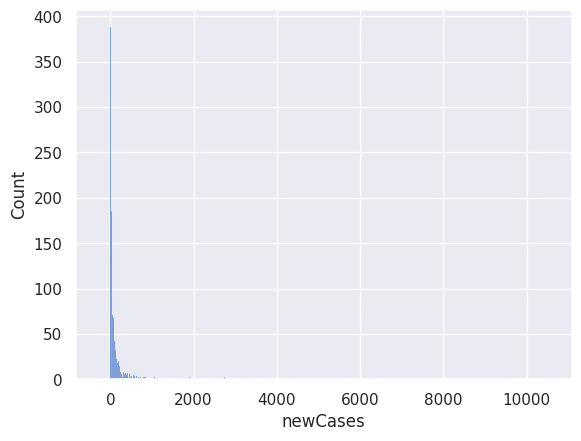

In [40]:
sns.histplot(data['newCases'].dropna());

Neste gráfico de distribuição, você pode ver claramente alguns dos valores que calculamos anteriormente. O valor mínimo é próximo a 0 e o valor máximo é próximo a 10 mil. Vimos claramente uma concentração em baixos valores de vendas de somente algumas muito altas, daí o alto desvio padrão.

# Exercício

Refaça a análise acima somente para o DF (state = 'DF').

,date,country,state,city,newDeaths,deaths,newCases,totalCases,deathsMS,totalCasesMS,deaths_per_100k_inhabitants,totalCases_per_100k_inhabitants,deaths_by_totalCases,recovered,suspects,tests,tests_per_100k_inhabitants
27,2020-03-07,Brazil,DF,TOTAL,0,0,1,1,0,1,0.00000,0.03316,0.00000,NaN,NaN,NaN,NaN
34,2020-03-08,Brazil,DF,TOTAL,0,0,0,1,0,1,0.00000,0.03316,0.00000,NaN,NaN,NaN,NaN
42,2020-03-09,Brazil,DF,TOTAL,0,0,0,1,0,1,0.00000,0.03316,0.00000,NaN,NaN,NaN,NaN
50,2020-03-10,Brazil,DF,TOTAL,0,0,0,1,0,1,0.00000,0.03316,0.00000,NaN,NaN,NaN,NaN
59,2020-03-11,Brazil,DF,TOTAL,0,0,1,2,0,2,0.00000,0.06633,0.00000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1560,2020-05-07,Brazil,DF,TOTAL,0,35,212,2258,35,2258,1.16076,74.88555,0.01550,1175.0,NaN,45176.0,1498.24162
1588,2020-05-08,Brazil,DF,TOTAL,2,37,184,2442,37,2442,1.22709,80.98783,0.01515,1223.0,NaN,45176.0,1498.24162
1616,2020-05-09,Brazil,DF,TOTAL,2,39,134,2576,39,2576,1.29342,85.43188,0.01514,1454.0,NaN,45176.0,1498.24162
1644,2020-05-10,Brazil,DF,TOTAL,3,42,106,2682,42,2682,1.39291,88.94732,0.01566,1372.0,415.0,55317.0,1834.56330


## Correlações

As correlações são uma ótima maneira de descobrir relacionamentos entre variáveis ​​numéricas. Existem várias maneiras de calcular a correlação. O coeficiente de correlação de Pearson é uma abordagem amplamente usada que mede a dependência linear entre duas variáveis. O coeficiente de correlação varia de -1 a 1. Uma correlação de 1 é uma correlação total positiva, uma correlação de -1 é uma correlação total negativa e uma correlação de 0 é uma correlação não linear. Podemos realizar esse cálculo usando a função corr em uma série. Por padrão, essa função usará o cálculo do coeficiente de correlação de Pearson. É possível usar diferentes métodos de cálculo com esta função.


In [50]:
data[['newDeaths','deaths','newCases','totalCases','deaths_per_100k_inhabitants']].corr()

,newDeaths,deaths,newCases,totalCases,deaths_per_100k_inhabitants
newDeaths,1.000000,0.891899,0.969431,0.892671,0.303634
deaths,0.891899,1.000000,0.906473,0.996341,0.340777
newCases,0.969431,0.906473,1.000000,0.914669,0.282756
totalCases,0.892671,0.996341,0.914669,1.000000,0.313009
deaths_per_100k_inhabitants,0.303634,0.340777,0.282756,0.313009,1.000000



Como você pode ver acima, a correlação entre cada variável e ela própria é 1. Obviamente, as variáveis ​​numéricas estão perfeitamente correlacionadas consigo mesmas.

Note ainda que os valores de 'newDeaths','deaths','newCases','totalCases' são fortemente correlacionados. Já o deaths_per_100k_inhabitants tem uma correlação bem mais fraca com os demais atributos pois ela depende de uma variável externa que é a população do estado (um certo número de casos e mortes podem  gerar uma contagem para cada 100 mil habitantes maior ou menor dependendo do tamanho da população do estado).

## Algumas observaçõe sobre variáveis ​​não numéricas

As métricas que foram extraídas anteriormente são principalmente aplicáveis ​​apenas a valores numéricos. Se você estiver lidando com outros tipos de dados, como dados categóricos, ainda poderá coletar algumas medidas interessantes. Você pode calcular a frequência de cada valor no conjunto de dados.

O DataFrame tem uma função chamada describe que resume o conjunto de dados. Se o seu DataFrame tiver apenas valores categóricos ou de texto, o resumo será adaptado especificamente para esse tipo de dados. Se houver tipos numéricos só eles serão considerados nas estatísticas.

In [52]:
data[[	'country',	'state',	'city']].describe()

,country,state,city
count,1694,1694,1694
unique,1,28,1
top,Brazil,SP,TOTAL
freq,1694,77,1694


## Bibliotecas de criação de perfil

Como você viu acima, a coleta de estatísticas descritivas pode ser um processo tedioso. Felizmente, existem bibliotecas que executam todo o processamento de dados para você. Eles produzem um perfil muito claro dos seus dados. O perfil de pandas é um deles. Essa biblioteca oferece perfis estatísticos prontos para uso do seu conjunto de dados. Como o conjunto de dados que estamos usando é organizado e padronizado, podemos usar a biblioteca imediatamente em nosso conjunto de dados.

In [54]:
profile = ydata_profiling.ProfileReport(data)

O perfil gerado pode ser mostrado no próprio Jupyter notebook:

In [55]:
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:533: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [56]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##  Salvando o relatório

Se você deseja gerar um arquivo de relatório HTML, salve o ProfileReport em um objeto e use a função to_file ():

In [57]:
# salva no diretório do notebook
profile.to_file("relatorioProfilingCovid.html")

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Exercício da semana

- Refaça essa análise descritiva considerando somente os estados do centro-oeste. Para isso, filtre os estados 'DF', 'GO', 'MS', 'TO' e 'MT' e siga os passos da análise.

- Note que a série vai do dia 25 de fevereiro de 2020 até 11 de maio de 2020. Adicione uma coluna com o dia da semana e crie um novo dataframe com os valores totalizados por dia da semana para o Brasil todo e analise as variações.

## Mais perguntas

Geralmente, depois de criar um perfil do seu conjunto de dados, você tem muito mais perguntas do que tinha inicialmente. Isso é ótimo, porque essas novas perguntas impulsionarão sua análise exploratória de dados.

Aqui estão algumas perguntas que reunimos ao fazer esse perfil:

- Faltam 77% dos dados dos testes. Por que? Como isso pode afetar nossa análise?
- Por que a distribuição de casos de covid é tão desigual? Será possível segmentar essa análise de forma a obter subgrupos mais homogêneos?
- O que explica a correlação entre 'newDeaths','deaths','newCases' e'totalCases'?? E por que 'deaths_per_100k_inhabitants' tem correlação mais fraca com os demais atributos?
- Existem diferenças nos totais de casos entre as regiões geográficas?

A criação de perfil de dados não é um processo linear. Ao filtrar e segmentar seu conjunto de dados, você retornará a ele e reunirá estatísticas descritivas sobre subgrupos de dados.

## Próximos passos

Neste caderno você viu como criar um perfil de um conjunto de dados. Agora você sabe como atribuir variáveis ​​a grupos de tipos de dados específicos. Você também calculou diferentes estatísticas descritivas no conjunto de dados e entende como interpretar essas medidas. Por fim, você viu que existem algumas bibliotecas que podem ajudá-lo a analisar o perfil de seu conjunto de dados. Mais importante, você gerou mais perguntas do que nunca para alimentar sua análise exploratória de dados.